In [3]:
!pip install opencv-python

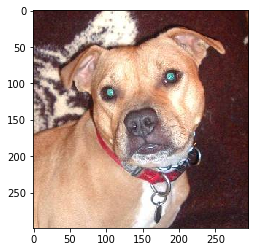

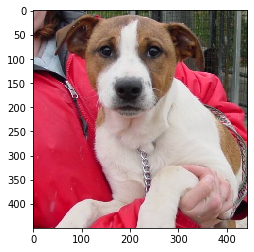

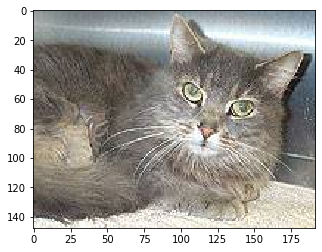

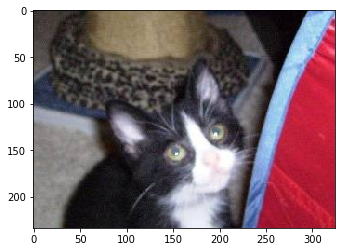

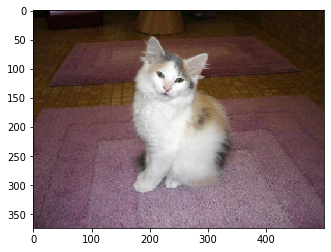

...

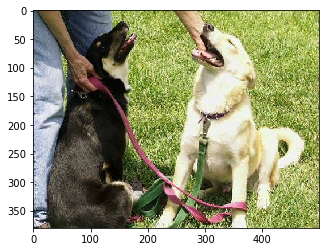

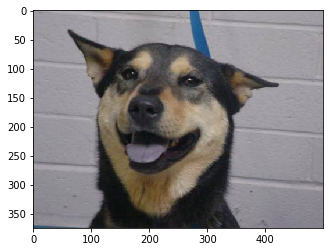

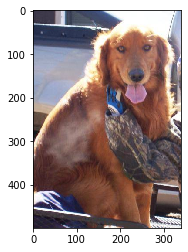

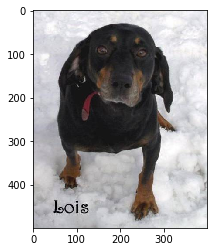

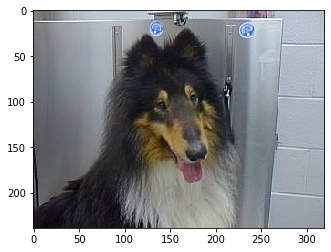

In [6]:
import cv2
import os
import glob
import matplotlib.pyplot as plt

image_folder_path = r'C:\Users\ahmad\Downloads\DAV Assignment 2\Image Dataset'
# Use glob to get a list of image file paths
image_files = glob.glob(os.path.join(image_folder_path, '*.jpg'))

# Display the images
for img_path in image_files:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.show()


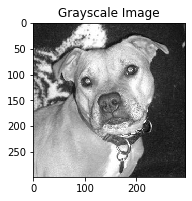

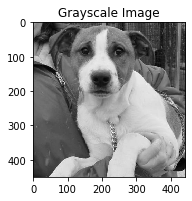

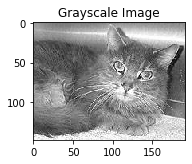

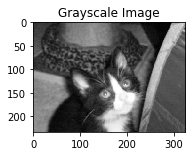

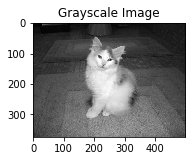

...

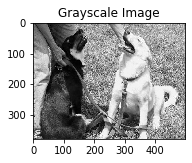

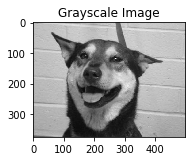

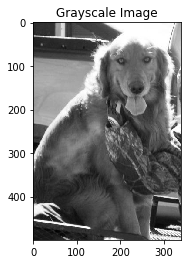

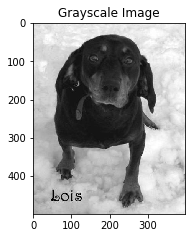

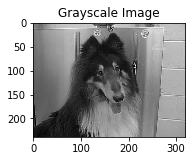

In [9]:
def convert_to_grayscale(img):
    # Convert the image to grayscale using the specified formula
    grayscale_img = 0.3 * img[:, :, 2] + 0.59 * img[:, :, 1] + 0.11 * img[:, :, 0]
    return grayscale_img

for img_path in image_files:
    img = cv2.imread(img_path)
    grayscale_img = convert_to_grayscale(img)
    plt.subplot(1, 2, 2)
    plt.imshow(grayscale_img, cmap='gray')
    plt.title('Grayscale Image')
    
    plt.show()


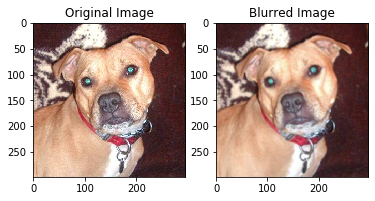

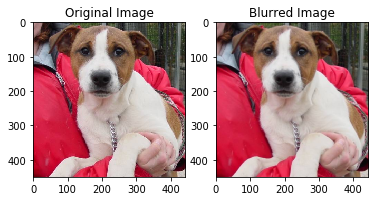

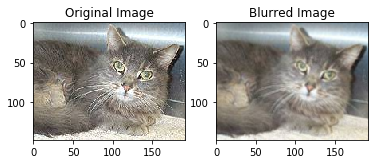

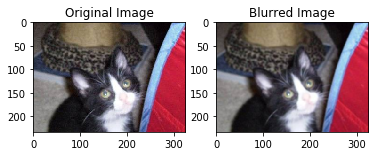

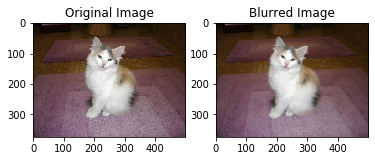

...

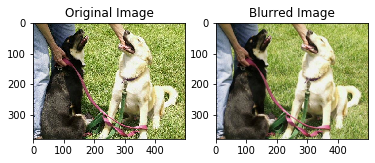

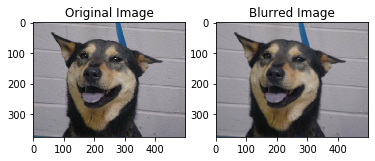

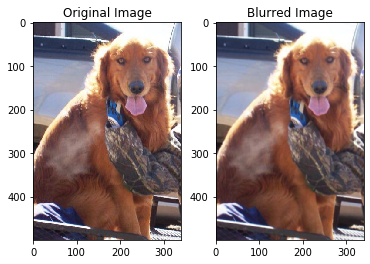

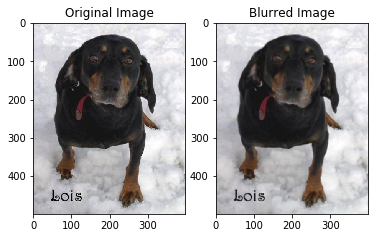

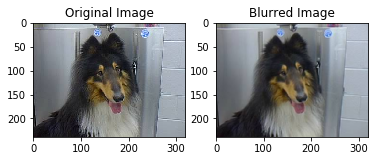

In [16]:
import numpy as np
def apply_convolution(image, kernel):
    return cv2.filter2D(image, -1, kernel)


# Define a 3x3 blur filter kernel
blur_kernel = np.ones((3, 3), np.float32) / 9

# Display the original and blurred images for the entire dataset
for img_path in image_files:
    img = cv2.imread(img_path)
    
    # Apply the convolution filter to the image
    blurred_img = apply_convolution(img, blur_kernel)

    # Display the original and blurred images
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    #BGR2RGB
    plt.imshow(cv2.cvtColor(blurred_img, cv2.COLOR_BGR2RGB))
    plt.title('Blurred Image')

    plt.show()



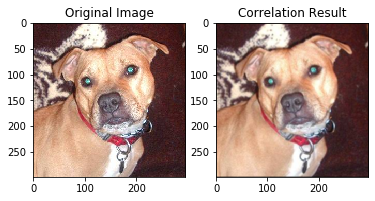

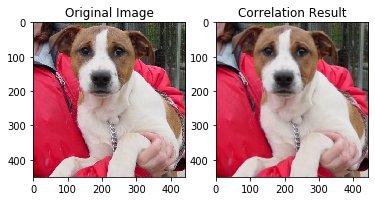

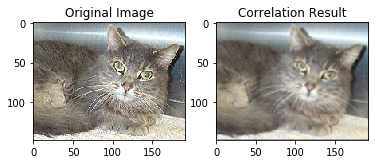

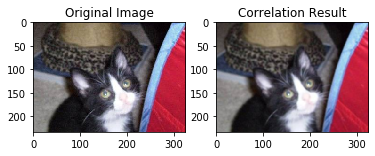

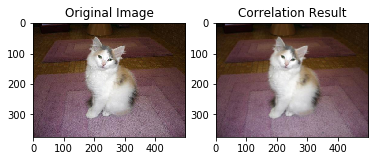

...

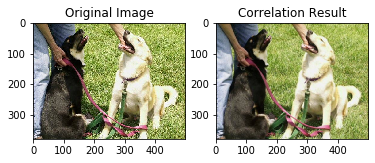

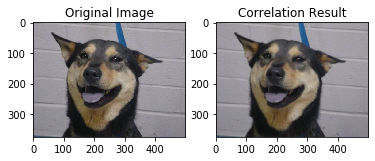

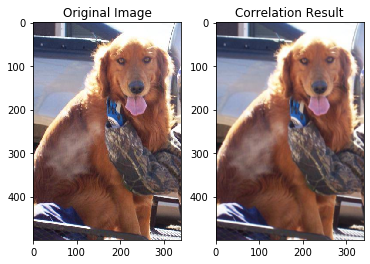

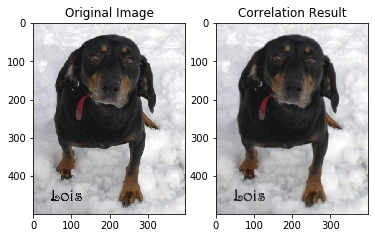

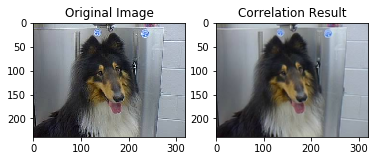

In [18]:
def apply_correlation(image, kernel):
    return cv2.filter2D(image, -1, kernel, borderType=cv2.BORDER_CONSTANT)

# Display original,correlated images
for img_path in image_files:
    img = cv2.imread(img_path)
    
    # Apply the correlation filter to the image
    correlated_img = apply_correlation(img, blur_kernel)

    # Display the original, convoluted, and correlated images
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(correlated_img, cv2.COLOR_BGR2RGB))
    plt.title('Correlation Result')

    plt.show()


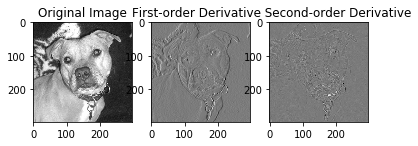

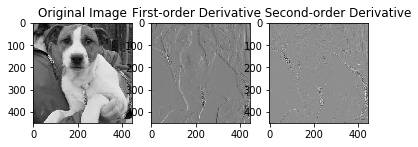

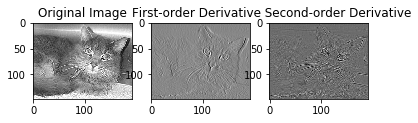

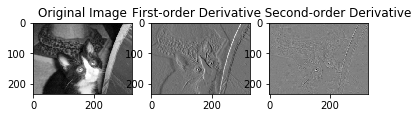

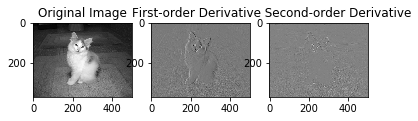

...

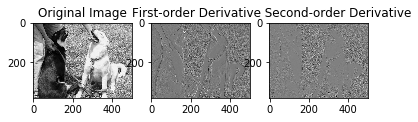

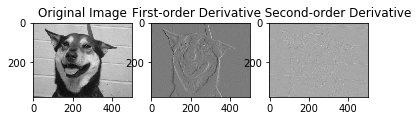

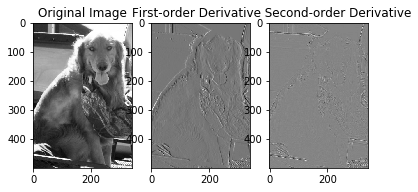

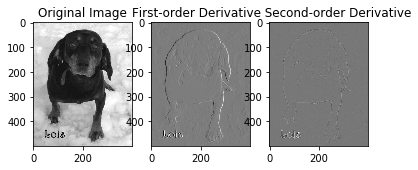

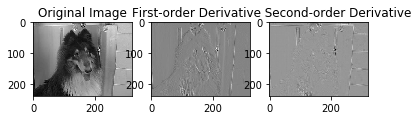

In [35]:

def apply_derivative_filter(image, order=1):
    if order == 1:
        # First-order derivative filter (Sobel filter)
        derivative_filter = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    else:
        order == 2
        # Second-order derivative filter (Laplacian filter)
        derivative_filter = cv2.Laplacian(image, cv2.CV_64F, ksize=3)
   
    return derivative_filter


# Display original, first-order derivative, and second-order derivative images
for img_path in image_files:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale for edge detection
    
    # Apply first-order derivative filter
    first_order_derivative_img = apply_derivative_filter(img, order=1)

    # Apply second-order derivative filter
    second_order_derivative_img = apply_derivative_filter(img, order=2)

    # Display the images
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(first_order_derivative_img, cmap='gray')
    plt.title('First-order Derivative  ')

    plt.subplot(1, 3, 3)
    plt.imshow(second_order_derivative_img, cmap='gray')
    plt.title('          Second-order Derivative')

    plt.show()


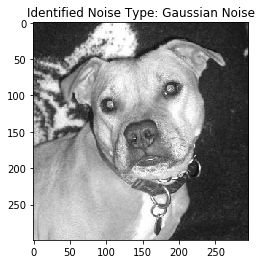

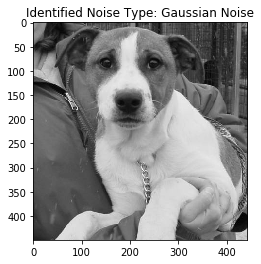

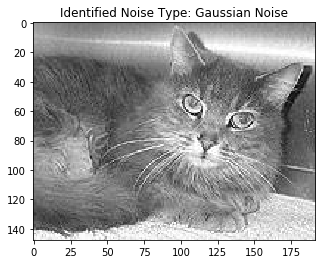

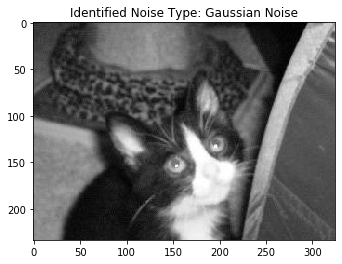

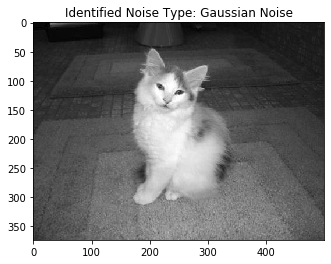

...

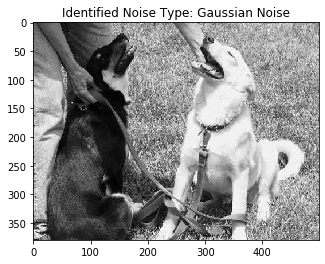

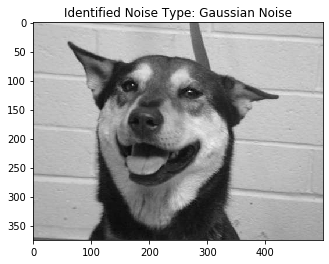

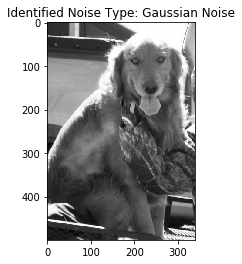

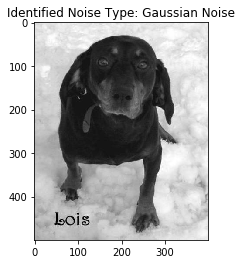

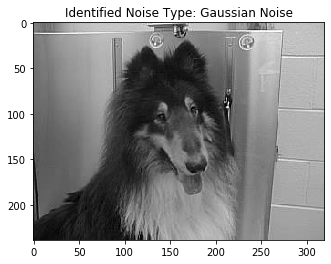

In [45]:
def identify_noise_type(image):
    return 'Salt and Pepper Noise' if np.std(image) < 30 else 'Gaussian Noise'

# Loop through each image
for img_path in image_files:
    img = cv2.imread(img_path,cv2.IMREAD_GRAYSCALE)

    noise_type = identify_noise_type(img)

    plt.imshow(img, cmap='gray')
    plt.title(f'Identified Noise Type: {noise_type}')
    plt.show()


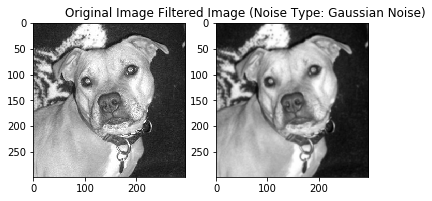

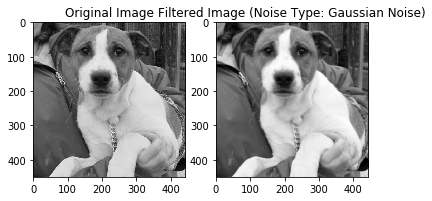

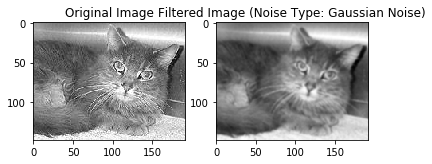

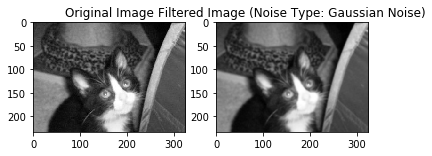

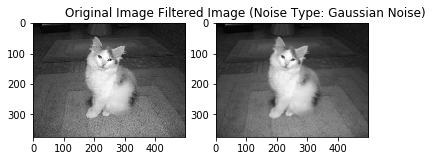

...

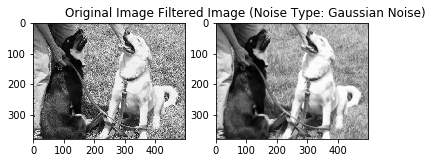

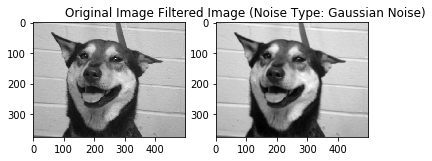

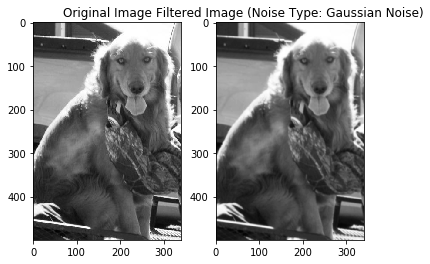

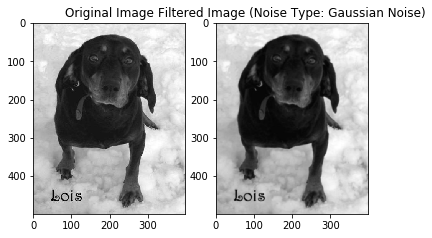

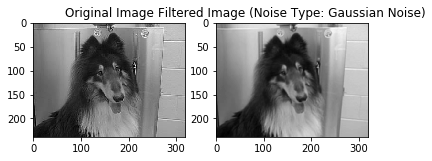

In [50]:
def apply_gaussian_filter(image, kernel_size=(5, 5), sigma_x=0):
    return cv2.GaussianBlur(image, kernel_size, sigma_x)
# Loop through each image
for img_path in image_files:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)


    img_filtered = apply_gaussian_filter(img)

    # Display the original and filtered images
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(img_filtered, cmap='gray')
    plt.title(f'Filtered Image (Noise Type: {noise_type})')

    plt.show()

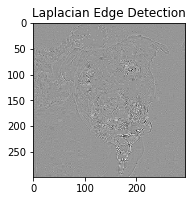

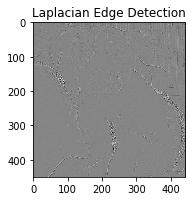

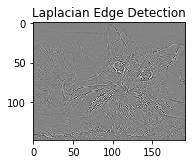

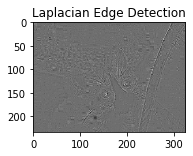

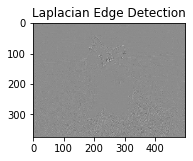

...

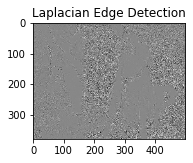

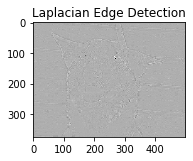

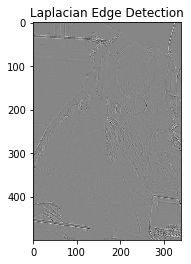

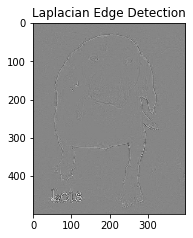

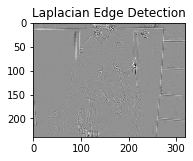

In [52]:
def apply_laplacian_edge_detection(image):
    return cv2.Laplacian(image, cv2.CV_64F)
for img_path in image_files:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    # Apply Laplacian edge detection
    edges = apply_laplacian_edge_detection(img)
    
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Laplacian Edge Detection')
    plt.show()